<a href="https://colab.research.google.com/github/areithaputri/Food-Traffic-Light-Public/blob/main/Food_Traffic_Light_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14064, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 14064 (delta 54), reused 75 (delta 51), pack-reused 13982
Receiving objects: 100% (14064/14064), 13.30 MiB | 34.65 MiB/s, done.
Resolving deltas: 100% (9711/9711), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 5.1 MB/s 
     |████████████████████████████████| 178 kB 8.3 MB/s 
     |████████████████████████████████| 145 kB 71.0 MB/s 
     |████████████████████████████████| 67 kB 6.5 MB/s 
     |████████████████████████████████| 1.1 MB 65.5 MB/s 
     |████████████████████████████████| 54 kB 3.2 MB/s 
     |████████████████████████████████| 138 kB 70.0 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8O31O2WnkqLVqw1SNqYd")
project = rf.workspace().project("food-traffic-lamp")
dataset = project.version(3).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Food-Traffic-Lamp-3 in yolov5pytorch:: 100%|██████████| 1726/1726 [00:00<00:00, 2143.11it/s]


In [ ]:
!python train.py --img 416 --batch 16 --epochs 25 --data {dataset.location}/data.yaml --weights yolov5l.pt --cache

train: weights=yolov5l.pt, cfg=, data=/content/datasets/Food-Traffic-Lamp-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Food-Traffic-Lamp-3/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 267 layers, 46129818 parameters, 0 gradients, 107.7 GFLOPs
image 1/37 /content/datasets/Food-Traffic-Lamp-3/test/images/186-Telur-Mata-Sapi-Images_-Stock_jpg.rf.01f3273fea15f688b2cfb2840f48d2b5.jpg: 416x416 1 Telur Mata Sapi, 30.3ms
image 2/37 /content/datasets/Food-Traffic-Lamp-3/test/images/2-Hal-yang-Bikin-Nasi-Putih-Lebih-Baik_jpg.rf.e0580747a4bf9ff8eb9cb5cffc0e898a.j

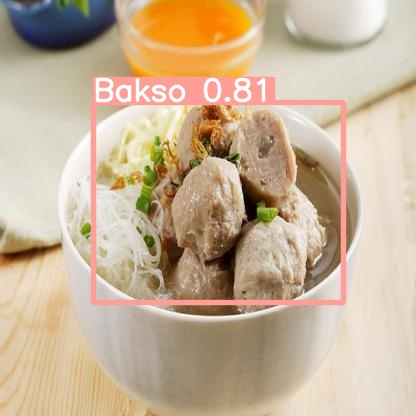

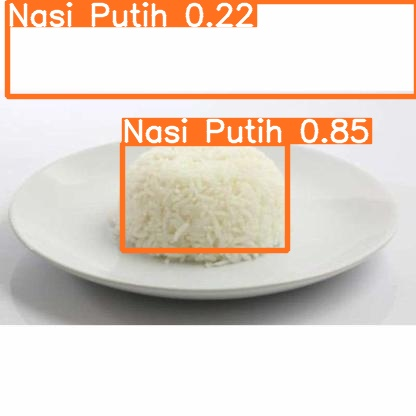

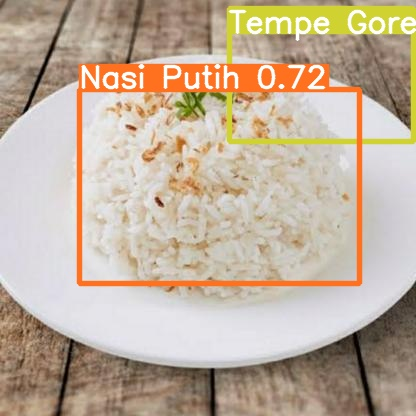

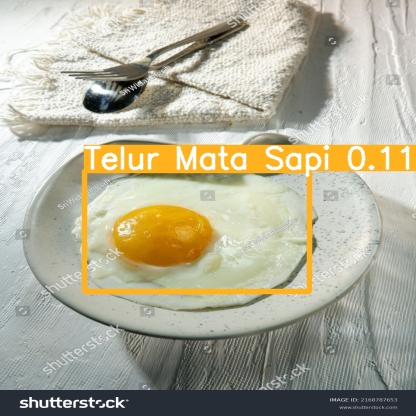

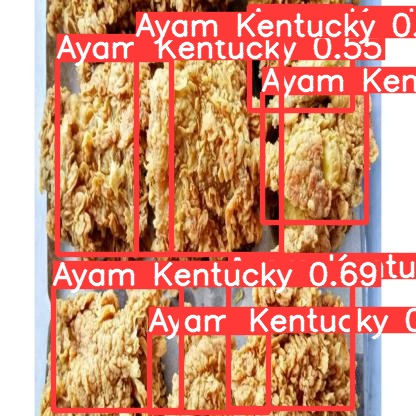

...

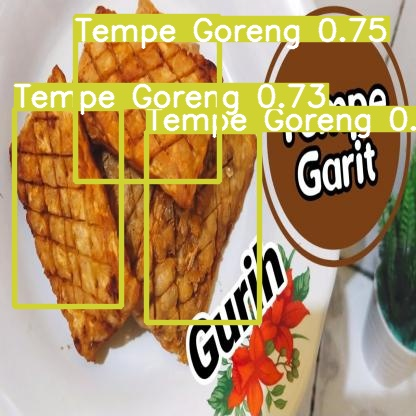

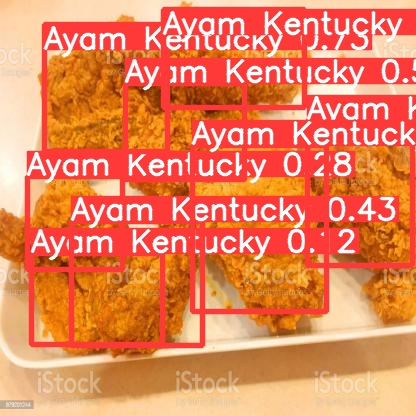

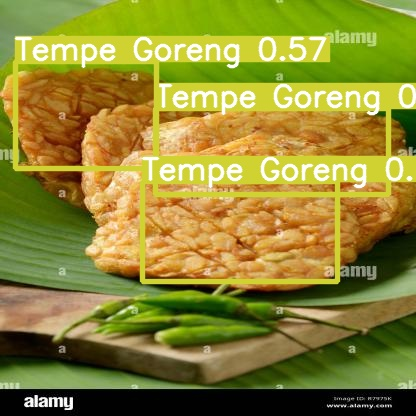

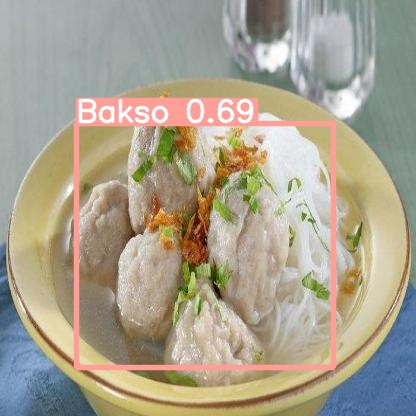

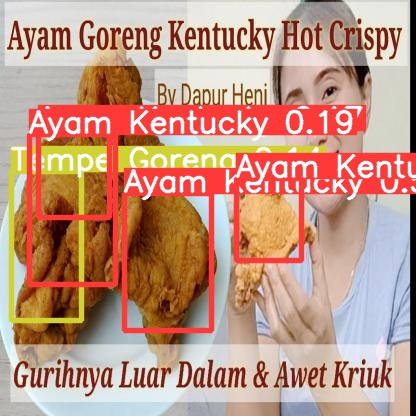

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!pip install plot-utils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.3 MB 29.6 MB/s 


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -r requirements.txt # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 14106, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 14106 (delta 83), reused 105 (delta 69), pack-reused 13982
Receiving objects: 100% (14106/14106), 13.24 MiB | 17.93 MiB/s, done.
Resolving deltas: 100% (9737/9737), done.
/content/yolov5/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)
  Using cached jedi-0.18.1-py2.py3-none-any.whl (1.6 MB)


In [ ]:
!python export.py --weights yolov5l.pt --include torchscript onnx

export: data=data/coco128.yaml, weights=['yolov5l.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients

PyTorch: starting from yolov5l.pt with output shape (1, 25200, 85) (89.3 MB)

TorchScript: starting export with torch 1.12.1+cu113...
TorchScript: export success ✅ 8.4s, saved as yolov5l.torchscript (178.2 MB)

ONNX: starting export with onnx 1.12.0...
ONNX: export success ✅ 6.8s, saved as yolov5l.onnx (177.9 MB)

Export complete (19.2s)
Results saved to /content/yolov5/yolov5
Detect:          python detect.py --weights yolov5l.onnx 
Validate:        python val.py --weights yolov5l.

In [ ]:
!python /content/yolov5/yolov5/detect.py --weights yolov5l.onnx

detect: weights=['yolov5l.onnx'], source=data/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Loading yolov5l.onnx for ONNX Runtime inference...
image 1/2 /content/yolov5/yolov5/data/images/bus.jpg: 640x640 4 persons, 1 bus, 38.7ms
image 2/2 /content/yolov5/yolov5/data/images/zidane.jpg: 640x640 2 persons, 1 tie, 37.4ms
Speed: 0.6ms pre-process, 38.1ms inference, 1.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


In [ ]:
!python /content/yolov5/yolov5/val.py --weights yolov5l.onnx

val: data=data/coco128.yaml, weights=['yolov5l.onnx'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Loading yolov5l.onnx for ONNX Runtime inference...
Forcing --batch-size 1 square inference (1,3,640,640) for non-PyTorch models
val: Scanning '/content/yolov5/datasets/coco128/labels/train2017.cache' images and labels... 126 found, 2 missing, 0 empty, 0 corrupt: 100% 128/128 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 128/128 [00:06<00:00, 19.44it/s]
                   all        128        929      0.785       0.71      0.813      0.601
Speed: 0.2ms pre-process, 38.6ms inference, 1.3ms NMS per ima

In [ ]:
!python export.py --weights yolov5l.pt --include onnx

!python detect.py --weights yolov5l.onnx --dnn  # detect
!python val.py --weights yolov5l.onnx --dnn  # validate

export: data=data/coco128.yaml, weights=['yolov5l.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients

PyTorch: starting from yolov5l.pt with output shape (1, 25200, 85) (89.3 MB)

ONNX: starting export with onnx 1.12.0...
ONNX: export success ✅ 6.6s, saved as yolov5l.onnx (177.9 MB)

Export complete (10.5s)
Results saved to /content/yolov5/yolov5
Detect:          python detect.py --weights yolov5l.onnx 
Validate:        python val.py --weights yolov5l.onnx 
PyTorch Hub:     model = torch.hub.load('ultralytics/yolov5', 'custom', 'yolov5l.onnx')  
Visualize:       https://netron.app
detect: weights=